## EE 782: Advanced Topics in Machine Learning
### **Assignment 2:** Metric Learning & Generative AI
> **NAME:** Munish Monga

> **ROLL NO:** 22M2153

> [Github Repo Link](https://github.com/munish30monga/Metric_Learning-Generative_AI)

### Table of Contents:
- [Introduction](#introduction)
- [Importing Libraries](#importing-libraries)
- [Hyperparameters](#hyperparameters)
- [References](#references)

### Introduction <a id="introduction"></a>
**PART A: Metric Learning using Siamese Network**
> We have to train a Siamese Network on Labeled Faces in the Wild (LFW) Dataset


**PART B: Generative AI using GANs**
> We have to train a generative model for generating face images, using a GAN.

## **PART B:** GANs <a id="part-b"></a>
> <font color="gray">Q11. Train a generative model for generating face images, using a GAN. The generator takes a
Gaussian noise vector as input, and tries to output a face image, while the discriminator
distinguishes between real and fake face images.</font>

### Importing Libraries <a id="importing-libraries"></a>

In [4]:
import pathlib as pl                                                # for path handling
import matplotlib.pyplot as plt                                     # for plotting
from PIL import Image                                               # for image handling
import random                                                       # for random number generation
import torch                                                        # for deep learning functionality
import numpy as np                                                  # for numerical operations  
import matplotlib.pyplot as plt                                     # for plotting 
import torch.nn as nn                                               # for neural network functionality
import torch.nn.functional as F                                     # for neural network functionality        
import torch                                                        # for deep learning functionality
import torchvision.transforms as T                                  # for image transformations
from torch.utils.data import Dataset, DataLoader                    # for dataset handling
from tqdm import tqdm                                               # for progress bar
import timm                                                         # for pretrained models
import albumentations as A                                          # for image augmentations
from albumentations.pytorch import ToTensorV2                       # for image augmentations
from itertools import combinations                                  # for combinations
from prettytable import PrettyTable                                 # for table formatting
import copy                                                         # for copying objects 
from sklearn.metrics import classification_report                   # for model evaluation
from torchsummary import summary                                    # for model summary
import shutil                                                       # for file handling
import os                                                           # for file handling
from torchvision.utils import save_image                            # for saving images
from IPython.display import Image as IPImage, HTML                  # for displaying images

### Hyperparameters <a id="hyperparameters"></a>

In [5]:
batch_size = 64                                                             # batch size for training
random_seed = 42                                                            # for reproducibility
random.seed(random_seed)                                                    # set random seed
os.environ['CUDA_VISIBLE_DEVICES'] = '4'                                    # set visible cuda device
device = 'cuda' if torch.cuda.is_available() else 'cpu'                     # set device to cuda if available
epochs = 20                                                                 # number of epochs to train
learning_rate = 0.01                                                        # learning rate for optimizer
base_model = "resnet18"                                                     # base model for Siamese network
loss_function = "BCE" # "hinge_loss", "BCE"                                 # loss function for Siamese network
margin = 1                                                                  # margin for hinge loss
threshold = 0.5                                                             # threshold for euclidean distance
max_positive_combinations=5                                                 # maximum number of positive combinations
patience = 0                                                                # patience for early stopping (0 means no early stopping)
lr_scheduler = None #'CosineAnnealingLR','ReduceLROnPlateau','CyclicLR'     # learning rate scheduler (None means no scheduler)
optimizer_type = 'Adam' # 'Adagrad', 'RMSprop'                              # optimizer type
weight_decay = 0                                                            # weight decay for optimizer (0 means no weight decay)
apply_augmentation = False                                                  # apply augmentation to training data or not
num_augmentations = 0                                                       # number of augmentations to apply per person
unfreeze_last_n = 0                                                         # unfreeze last n layers of base model (0 means no unfreezing, -1 means make all layers trainable)

### Exploring Dataset <a id="exploring-dataset"></a>

In [6]:
data_dir = pl.Path('./dataset/lfw/')     # Setting path to the data directory
persons_dirs = [d for d in data_dir.iterdir() if d.is_dir()] # List all subdirectories (each directory corresponds to a person)
all_persons_dict = {person_dir.name: len(list(person_dir.glob("*.jpg"))) for person_dir in persons_dirs} # Create a dictionary of all persons and the number of images they have
all_persons = list(all_persons_dict.keys())             # List of all persons

In [4]:
print(f"Total number of persons: {len(all_persons)}")  # Print the number of persons
for i, (person, num_images) in enumerate(all_persons_dict.items()):  # Loop through all persons dictionary
    if i >= 10:                     # Break the loop after printing 10 persons
        break
    print(f"{i+1}.{person}: {num_images}")  # Print the number of images for each person

Total number of persons: 5749
1.Maria_Guida: 1
2.Lon_Kruger: 2
3.Dennis_Miller: 1
4.Nathalia_Gillot: 1
5.Camryn_Manheim: 1
6.Justin_Timberlake: 8
7.Vanessa_Laine: 1
8.Ion_Tiriac: 1
9.Stephen_Swindal: 1
10.Sandra_Shamas: 1


In [4]:
def visualize_dataset(persons_dict):
    """
    Visualizes a grid of persons' images.
    
    Args:
    - persons_dict (dict): Dictionary with person names as keys and the number of images as values.
    """
    # Display in an 8x8 grid
    fig, axes = plt.subplots(8, 8, figsize=(15, 15))
    
    grid_position = 0  # Counter for the position in the 8x8 grid
    
    for person, count in persons_dict.items():
        if grid_position >= 64:  # Break after 64 cells
            break
        person_dir = data_dir / person
        images = list(person_dir.glob("*.jpg"))
        for img_path in images:
            if grid_position >= 64:  # Break after 64 cells
                break
            image = Image.open(img_path)
            image = image.resize((64, 64))
            row, col = divmod(grid_position, 8)
            axes[row, col].imshow(image)
            axes[row, col].axis('off')
            axes[row, col].set_title(f"{person}")
            grid_position += 1

    plt.tight_layout()
    plt.show()

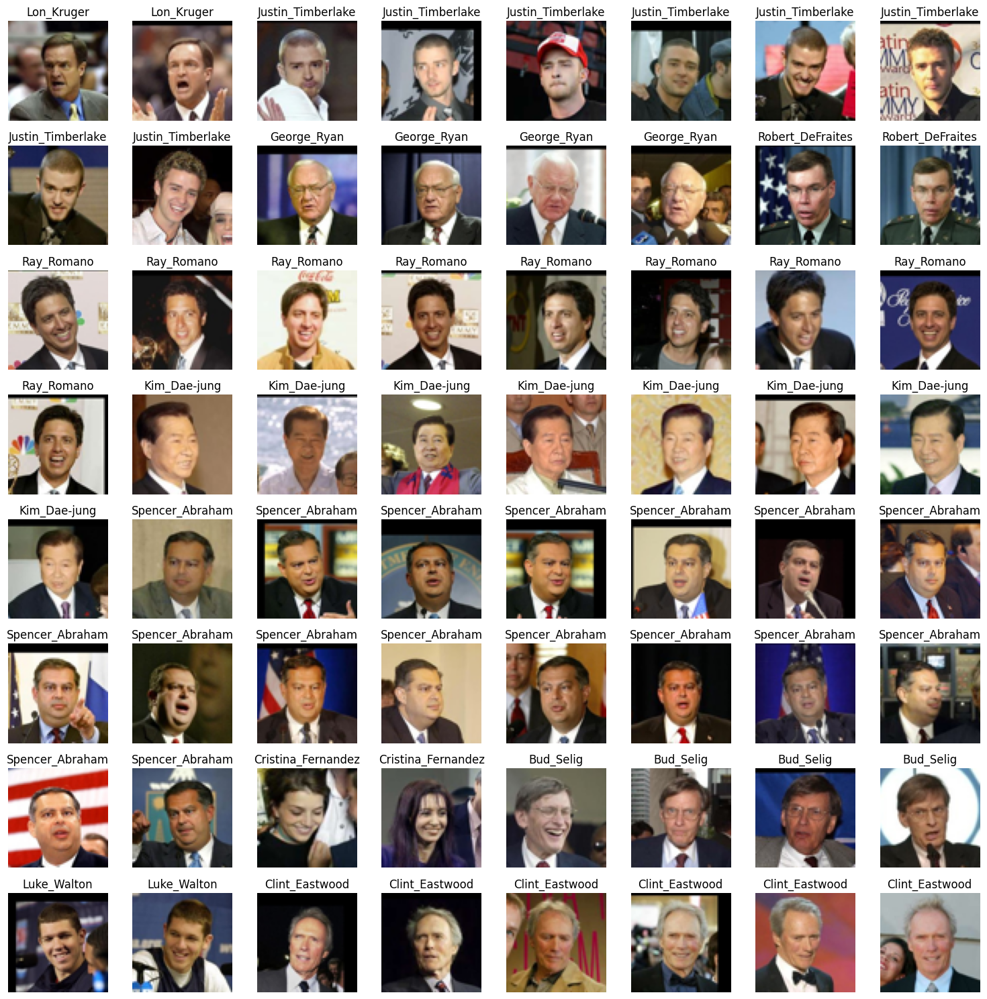

In [7]:
visualize_dataset(all_persons_dict)

### Siamase Network (from Part A) <a id="siamase-network"></a>

In [4]:
class SiameseNetwork(nn.Module):
    """
    Siamese Neural Network for learning embeddings using pairs of images. 

    Attributes:
    - base_model (nn.Module): The base model used for feature extraction.
    - embedding_size (int): Size of the embedding produced by the base model.
    - projection (nn.Linear): Linear layer to project embeddings to desired size (512).

    Methods:
    - forward_one(x): Computes the embedding for a single input image.
    - forward(input1, input2): Computes the embeddings for a pair of input images.
    """
    def __init__(self, base_model, unfreeze_last_n):
        """
        Initializes the SiameseNetwork with a given base model.

        Args:
        - base_model (str): Name of the base model to use
        - unfreeze_last_n (int): Number of layers to unfreeze from the end
        """
        super(SiameseNetwork, self).__init__()
        
        # Create the model
        self.base_model = timm.create_model(base_model, pretrained=True)
        
        # Get the number of features (embedding size) from the base model
        self.embedding_size = self.base_model.num_features
        
        # Remove the classification head
        self.base_model = nn.Sequential(*list(self.base_model.children())[:-1])

        # If unfreeze_last_n is -1, make all layers trainable
        if unfreeze_last_n == -1:
            for param in self.base_model.parameters():
                param.requires_grad = True
        else:
            # Freeze all layers initially
            for param in self.base_model.parameters():
                param.requires_grad = False

            # Unfreeze the last n layers
            num_layers = len(list(self.base_model.children()))
            for i, child in enumerate(self.base_model.children()):
                if i >= num_layers - unfreeze_last_n:
                    for param in child.parameters():
                        param.requires_grad = True
        
        # Projection layer to get embeddings of size 512
        self.projection = nn.Sequential(
            nn.Linear(self.embedding_size, 512),
            nn.BatchNorm1d(512))

    def forward_once(self, x):
        # Forward pass for one input
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        x = self.projection(x)
        return x

    def forward(self, input1, input2):
        # Forward pass for both inputs
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

### Contrastive Loss Function (from Part A) <a id="contrastive-loss-function"></a>

In [5]:
class ContrastiveLoss(nn.Module):
    """
    Contrastive loss for Siamese networks.

    Attributes:
    - margin (float): Margin for the contrastive loss.

    Methods:
    - forward(output1, output2, label): Computes the contrastive loss given a pair of embeddings and their label.
    """
    def __init__(self, margin=2.0):
        """
        Initializes the ContrastiveLoss with a given margin.

        Args:
        - margin (float): Margin for the contrastive loss.
        """
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2)
        loss = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                          (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))
        return loss

### LR Schedulers (from Part A) <a id="lr-schedulers"></a>

In [21]:
def choose_lr_scheduler(lr_scheduler, optimizer, num_epochs):
    if lr_scheduler == "CosineAnnealingLR":
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)
        print("Using CosineAnnealingLR scheduler...")
    elif lr_scheduler == "CyclicLR":
        base_lr = 1e-5
        max_lr = 1e-2
        scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=base_lr, max_lr=max_lr, step_size_up=2000, mode='triangular2', cycle_momentum=False)
        print("Using CyclicLR scheduler...")
    elif lr_scheduler == "ReduceLROnPlateau":
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True)
        print("Using ReduceLROnPlateau scheduler...")
    else:
        scheduler = None
    return scheduler

### Preprocessing Data for GANs <a id="preprocessing-data-for-gan"></a>

In [6]:
def preprocess_data_for_GAN(persons_dict):
    """
    Preprocess the images in the data directory using albumentations by applying a center crop and normalization.

    Args:
    - data_dir (Path): Directory containing the images.

    Returns:
    - X_processed (list): List of preprocessed images.
    """
    transforms = A.Compose([
        A.CenterCrop(128, 128),
        # A.Resize(64, 64),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
        ToTensorV2()
    ])
    
    X_processed = []

    for person, _ in persons_dict.items():
        person_dir = data_dir / person
        images = list(person_dir.glob("*.jpg"))
        for img_path in images:
            img = Image.open(img_path)
            img = np.array(img)
            img = transforms(image=img)['image']
            X_processed.append(img) 
    print(f"{len(X_processed)} images preprocessed.")
    return X_processed

In [7]:
def denormalize_data_for_GAN(tensor):
    """
    Denormalize a tensor.

    Args:
    - tensor (torch.Tensor): The normalized tensor.
    - mean (list): The mean values used for normalization.
    - std (list): The standard deviation values used for normalization.

    Returns:
    - torch.Tensor: The denormalized tensor.
    """
    mean = torch.tensor([0.5, 0.5, 0.5]).view(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor([0.5, 0.5, 0.5]).view(1, 3, 1, 1).to(tensor.device)
    return tensor * std + mean

In [8]:
X_processed = preprocess_data_for_GAN(all_persons_dict)

13233 images preprocessed.


### GAN Dataloader <a id="gan-dataloader"></a>

In [11]:
class GAN_Dataset(Dataset):
    """
    Dataset class for GANs.

    Attributes:
    - X (list): List of images.

    Methods:
    - __len__(): Returns the number of images in the dataset.
    - __getitem__(index): Returns the image at the given index.
    """
    def __init__(self, X):
        """
        Initializes the GAN_Dataset with given images.

        Args:
        - X (list): List of images.
        """
        self.X = X

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        return self.X[index]

In [12]:
gan_dataset = GAN_Dataset(X_processed)
gan_loader = DataLoader(gan_dataset, batch_size=128, shuffle=True, num_workers=16, pin_memory=True, drop_last=True)

In [12]:
# Fetching one batch from the DataLoader
for img_batch in gan_loader:
    print(f"Shape of img_batch: {img_batch.shape}")  # img_batch shape
    break

Shape of img_batch: torch.Size([128, 3, 128, 128])


**Shape of Batch**: $(N, C, H, W)$

where: 
- $N$: represents the Batch Size
- $C$: represents the Number of channels in the image
- $H$: represents the Height of the image
- $W$: represents the Width of the image

In [13]:
def visualize_batch_for_GAN(dataloader, num_samples=16):
    """
    Visualize a batch of images from the GAN's dataloader.

    Args:
    - dataloader (DataLoader): DataLoader object for the GAN.
    - num_samples (int): Number of samples to visualize, default is 16.
    """
    
    img_batch = next(iter(dataloader))
    
    # Denormalize the images
    img_batch = denormalize_data_for_GAN(img_batch)
    
    # Randomly sample indices for visualization
    indices = random.sample(range(len(img_batch)), num_samples)
    
    fig, axes = plt.subplots(4, 4, figsize=(8, 8))
    
    for i, idx in enumerate(indices):
        img = np.clip(img_batch[idx].permute(1, 2, 0).numpy(), 0, 1)
        row, col = divmod(i, 4)
        axes[row, col].imshow(img, cmap='gray')
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

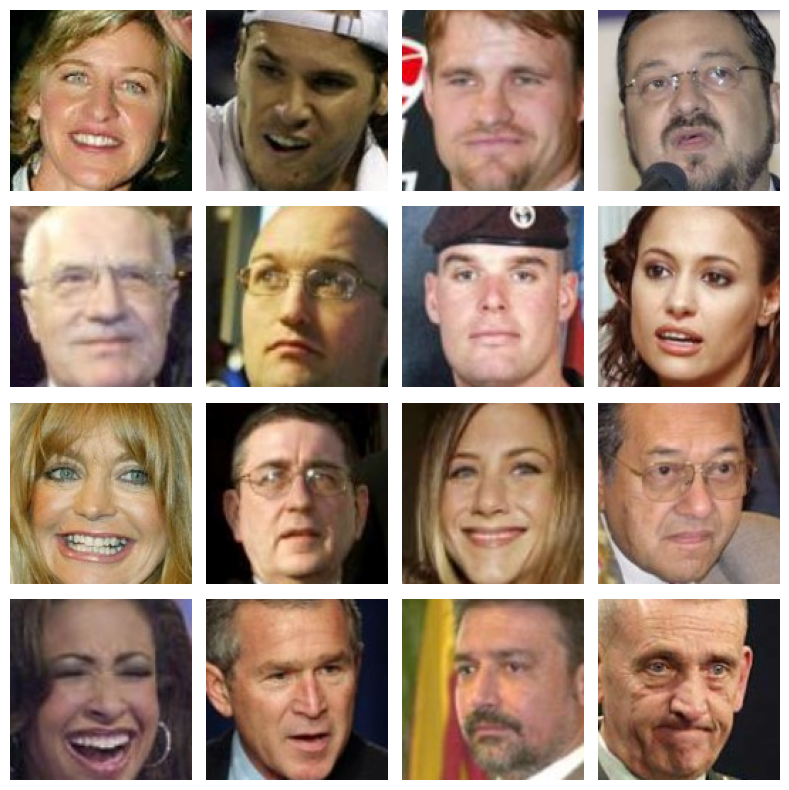

In [14]:
visualize_batch_for_GAN(gan_loader)

### WGAN Generator Model <a id="generator-model"></a>

In [28]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # N x channels_noise x 1 x 1
            self._block(channels_noise, features_g * 32, 4, 1, 0),  # 4x4
            self._block(features_g * 32, features_g * 16, 4, 2, 1),  # 8x8
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # 16x16
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # 32x32
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # 64x64
            nn.ConvTranspose2d(features_g * 2, channels_img, 4, 2, 1),  # 128x128
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)

### WGAN Discriminator Model <a id="discriminator-model"></a>

In [29]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # N x channels_img x 128 x 128
            nn.Conv2d(channels_img, features_d, 4, 2, 1),  # 64x64
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d * 2, 4, 2, 1),  # 32x32
            self._block(features_d * 2, features_d * 4, 4, 2, 1),  # 16x16
            self._block(features_d * 4, features_d * 8, 4, 2, 1),  # 8x8
            self._block(features_d * 8, features_d * 16, 4, 2, 1),  # 4x4
            nn.Conv2d(features_d * 16, 1, 4, 2, 0),  # 1x1
        )
    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)

### Helper Functions <a id="helper-functions"></a>

In [16]:
def save_generated_imgs(generator, epoch, fixed_noise, num_epochs, folder_name):
    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    generator.eval()  # Set generator to evaluation mode
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
    denormalized_images = denormalize_data_for_GAN(fake_images)    # take 64 imgs to save
    img_path = gen_imgs_dir / f"epoch_{epoch}.png"
    save_image(denormalized_images, img_path, normalize=True, nrow=8)  # 8x8 grid

    # If it's the last epoch, generate a GIF of all saved images
    if epoch == num_epochs:
        images = [Image.open(gen_imgs_dir / f"epoch_{e}.png") for e in range(1, num_epochs + 1)]
        gif_path = gen_imgs_dir / "generated_images.gif"
        images[0].save(
            gif_path,
            save_all=True,
            append_images=images[1:],
            duration=100,
            loop=0,
        )

In [19]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

### Gradient Penalty Function (WGAN-GP) <a id="gradient-penalty"></a>

In [18]:
def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

### WGAN Training Loop <a id="training-loop-for-gan"></a>

In [32]:
def train_WGAN(generator, discriminator, train_loader, num_epochs, folder_name, learning_rate, z_dim = 100, lr_scheduler=None, disc_iterations=5, lambda_gp=10):

    # Move models to device
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    
    # Optimizers
    optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.0, 0.9))
    optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.0, 0.9))
    
    # Define learning rate scheduler
    scheduler_g = choose_lr_scheduler(lr_scheduler, optimizer_g, num_epochs)
    scheduler_d = choose_lr_scheduler(lr_scheduler, optimizer_d, num_epochs)

    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    if gen_imgs_dir.exists():
        shutil.rmtree(gen_imgs_dir)
    gen_imgs_dir.mkdir(exist_ok=True)  
      
    losses_g, losses_d = [], []
    real_scores, fake_scores = [], []

    for epoch in range(1, num_epochs+1):
        generator.train()
        discriminator.train()
        running_loss_g = 0.0
        running_loss_d = 0.0
        running_real_score = 0.0
        running_fake_score = 0.0
        
        for real_images in train_loader:
            real_images = real_images.to(device)
            batch_size = real_images.size(0)
            
            # Train Discriminator
            for _ in range(disc_iterations):
                noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
                fake_images = generator(noise)
                # Real images
                critic_real = discriminator(real_images).reshape(-1)
                # Fake images
                critic_fake = discriminator(fake_images.detach()).reshape(-1)
                gp = gradient_penalty(discriminator, real_images, fake_images, device=device)
                loss_d = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_gp * gp
                optimizer_d.zero_grad()
                loss_d.backward(retain_graph=True)
                optimizer_d.step()

            # Train Generator
            fake_images = generator(noise)
            gen_fake = discriminator(fake_images).reshape(-1)
            loss_g = -torch.mean(gen_fake)
            optimizer_g.zero_grad()
            loss_g.backward()
            optimizer_g.step()
            
            running_loss_g += loss_g.item()
            running_loss_d += loss_d.item()
            running_real_score += critic_real.mean().item()
            running_fake_score += critic_fake.mean().item()

        # Learning Rate Scheduling
        if scheduler_g:
            if isinstance(scheduler_g, torch.optim.lr_scheduler.ReduceLROnPlateau):
                scheduler_g.step(running_loss_g)
            else:
                scheduler_g.step()
        if scheduler_d:
            if isinstance(scheduler_d, torch.optim.lr_scheduler.ReduceLROnPlateau):
                scheduler_d.step(running_loss_d)
            else:
                scheduler_d.step()
        
        avg_loss_g = running_loss_g / len(train_loader)
        avg_loss_d = running_loss_d / len(train_loader)
        avg_real_score = running_real_score / len(train_loader)
        avg_fake_score = running_fake_score / len(train_loader)

        losses_g.append(avg_loss_g)
        losses_d.append(avg_loss_d)
        real_scores.append(avg_real_score)
        fake_scores.append(avg_fake_score)
        
        fixed_noise = torch.randn(64, z_dim, 1, 1).to(device)
        save_generated_imgs(generator, epoch, fixed_noise, num_epochs, folder_name)
        
        # Print epoch details
        print(f'''{"#"*100}
Epoch: [{epoch}/{num_epochs}] | Gen Loss: {avg_loss_g:.5f} | Disc Loss: {avg_loss_d:.5f} | Real Score: {avg_real_score:.5f} | Fake Score: {avg_fake_score:.5f}
{"#"*100}''')
            
    return losses_g, losses_d, real_scores, fake_scores

In [34]:
generator = Generator(channels_noise=128, channels_img=3, features_g=16).to(device)
discriminator = Discriminator(channels_img=3, features_d=16).to(device)
initialize_weights(generator)
initialize_weights(discriminator)
losses_g, losses_d, real_scores, fake_scores = train_WGAN(generator, discriminator, gan_loader, num_epochs=100, folder_name='WGAN', learning_rate=1e-4, z_dim=128, lr_scheduler=None, disc_iterations=5, lambda_gp=10)

####################################################################################################
Epoch: [1/100] | Gen Loss: 59.19882 | Disc Loss: -93.46253 | Real Score: 59.99772 | Fake Score: -58.98297
####################################################################################################
####################################################################################################
Epoch: [2/100] | Gen Loss: 158.85412 | Disc Loss: -239.27090 | Real Score: 149.46614 | Fake Score: -157.93533
####################################################################################################
####################################################################################################
Epoch: [3/100] | Gen Loss: 227.67336 | Disc Loss: -259.68111 | Real Score: 164.78282 | Fake Score: -225.45525
####################################################################################################
####################################################################

### Plotting Losses & Scores <a id="plotting-losses-and-scores"></a>

In [35]:
def plot_GAN_loss(losses_g, losses_d, real_scores, fake_scores):
    """
    Plot the training losses of the Generator and the Discriminator, and the real vs. fake scores.
    
    Args:
    - losses_g (list): List of training losses for the Generator.
    - losses_d (list): List of training losses for the Discriminator.
    - real_scores (list): List of real scores per epoch.
    - fake_scores (list): List of fake scores per epoch.
    """
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plotting the Generator and Discriminator loss on the left subplot
    ax1.plot(losses_g, label='Generator Loss', color='blue')
    ax1.plot(losses_d, label='Discriminator Loss', color='red')
    ax1.set_title("Generator vs. Discriminator Loss")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Loss")
    ax1.legend()
    ax1.grid(True, linestyle='--', alpha=0.7)

    # Plotting the real vs. fake scores on the right subplot
    ax2.plot(real_scores, label='Real Score', color='green')
    ax2.plot(fake_scores, label='Fake Score', color='orange')
    ax2.set_title("Real vs. Fake Scores")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Score")
    ax2.legend()
    ax2.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

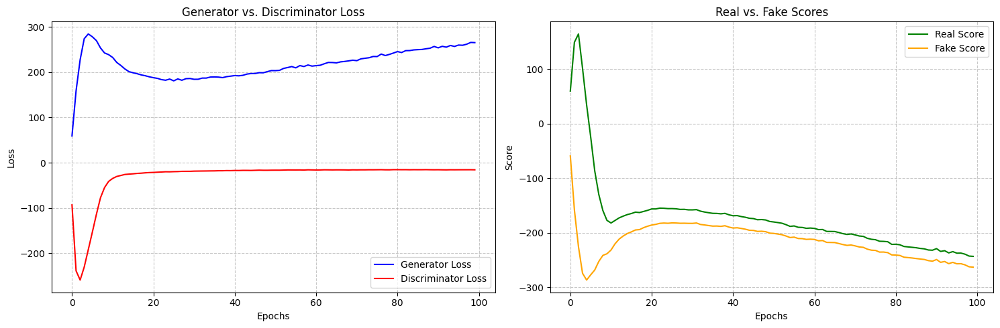

In [36]:
plot_GAN_loss(losses_g, losses_d, real_scores, fake_scores)

### Visualizing Generated Images <a id="visualizing-generated-images"></a>

In [8]:
def display_side_by_side(*images):
    """
    Utility function to display images side by side.
    """
    html_str = ""
    for img in images:
        html_str += f"<img style='width: 500px; margin: 0px; float: left; border: 1px solid black;' src='{img.filename}' />"
    
    display(HTML(html_str))

In [9]:
def visualize_GAN_results(num_epochs, every_n_epochs, folder_name):
    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    images_to_display = []

    for epoch in range(1, num_epochs + 1):
        if epoch % every_n_epochs == 0:
            img_path = gen_imgs_dir / f"epoch_{epoch}.png"
            if img_path.exists():
                images_to_display.append(plt.imread(img_path))

    # Plotting the images
    num_images = len(images_to_display)
    fig, axes = plt.subplots(num_images // 2, 2, figsize=(10, num_images * 2))
    
    for idx, ax in enumerate(axes.flat):
        if idx < len(images_to_display):
            ax.imshow(images_to_display[idx])
            ax.axis("off")
            ax.set_title(f"Epoch {every_n_epochs * (idx+1)}", fontsize=16)
    
    plt.tight_layout()
    plt.show()
    
    # Displaying the GIF
    gif_path = gen_imgs_dir / "generated_images.gif"
    display_side_by_side(IPImage(filename=gif_path))

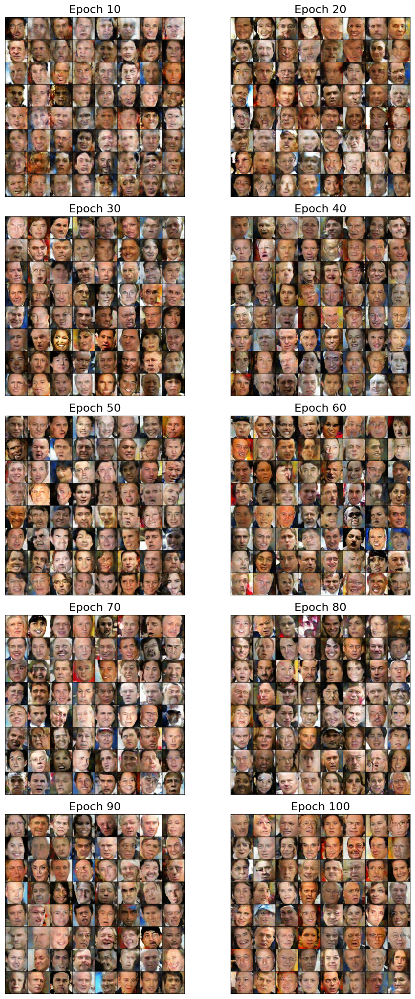

In [10]:
visualize_GAN_results(num_epochs=100, every_n_epochs=10, folder_name='WGAN')

### Advanced: Conditional GAN with Siamese Network <a id="conditional-gan-with-siamese-network"></a>
> <font color="gray">Q12. Modify the GAN to become a conditional GAN, where the condition itself is (features of)
a real face image. The CGAN should generate another image of the same person, and you can
use the Siamese network from Part-A as an additional discriminator for person matching. You
will need to ensure that it does not simply show the same image as the one used for conditional
input.</font>
### cGAN Generator Model <a id="cgan-generator-model"></a>

In [13]:
class cGAN_Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g, condition_dim):
        super(cGAN_Generator, self).__init__()
        self.condition_dim = condition_dim
        self.net = nn.Sequential(
            self._block(channels_noise + condition_dim, features_g * 32, 4, 1, 0),  # img: 4x4
            self._block(features_g * 32, features_g * 16, 4, 2, 1),  # img: 8x8
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 16x16
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 32x32
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 64x64
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),  # img: 128x128
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, noise, condition):
        x = torch.cat((noise, condition), 1)
        return self.net(x)

### cGAN Discriminator Model <a id="cgan-discriminator-model"></a>

In [14]:
class cGAN_Discriminator(nn.Module):
    def __init__(self, channels_img, features_d, condition_dim):
        super(cGAN_Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img + condition_dim, features_d, kernel_size=4, stride=2, padding=1),  # img: 64x64
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d * 2, 4, 2, 1),  # img: 32x32
            self._block(features_d * 2, features_d * 4, 4, 2, 1),  # img: 16x16
            self._block(features_d * 4, features_d * 8, 4, 2, 1),  # img: 8x8
            self._block(features_d * 8, features_d * 16, 4, 2, 1),  # img: 4x4
            nn.Conv2d(features_d * 16, 1, kernel_size=4, stride=2, padding=0),  # img: 1x1
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, image, condition):
        condition = condition.view(condition.size(0), condition.size(1), 1, 1)
        condition = condition.repeat(1, 1, image.size(2), image.size(3))
        x = torch.cat((image, condition), 1)
        return self.disc(x)

### Gradient Penalty Function (cGAN specific) <a id="gradient-penalty(cgan-specific)"></a> 

In [15]:
def cGAN_gradient_penalty(critic, real, fake, condition, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, condition).reshape(-1)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

### Helper Functions (cGAN specific) <a id="helper-functions(cgan-specific)"></a>

In [16]:
def cGAN_save_generated_imgs(generator, real_images, condition, epoch, fixed_noise, num_epochs, folder_name):
    fixed_noise = fixed_noise[:64]
    condition = condition[:64]
    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    generator.eval()  # Set generator to evaluation mode
    condition = condition[:64]    
    # Save Real Images
    denormalized_real_images = denormalize_data_for_GAN(real_images.cpu())
    real_img_path = gen_imgs_dir / f"real_{epoch}.png"
    save_image(denormalized_real_images, real_img_path, normalize=True, nrow=8)  # 8x8 grid

    # Generate and Save Fake Images
    with torch.no_grad():
        fake_images = generator(fixed_noise, condition).detach().cpu()
    denormalized_fake_images = denormalize_data_for_GAN(fake_images)
    fake_img_path = gen_imgs_dir / f"fake_{epoch}.png"
    save_image(denormalized_fake_images, fake_img_path, normalize=True, nrow=8)  # 8x8 grid

    # If it's the last epoch, generate separate GIFs for real and fake images
    if epoch == num_epochs:
        # Generate GIF for real images
        real_images = [Image.open(gen_imgs_dir / f"real_{e}.png") for e in range(1, num_epochs + 1)]
        real_gif_path = gen_imgs_dir / "real_images.gif"
        real_images[0].save(
            real_gif_path,
            save_all=True,
            append_images=real_images[1:],
            duration=100,
            loop=0,
        )

        # Generate GIF for fake images
        fake_images = [Image.open(gen_imgs_dir / f"fake_{e}.png") for e in range(1, num_epochs + 1)]
        fake_gif_path = gen_imgs_dir / "fake_images.gif"
        fake_images[0].save(
            fake_gif_path,
            save_all=True,
            append_images=fake_images[1:],
            duration=100,
            loop=0,
        )

### cGAN Training Loop <a id="training-loop-for-cgan"></a>

In [26]:
def train_cGAN(generator, discriminator, siamese_net, train_loader, num_epochs, folder_name, learning_rate, margin, z_dim = 100, lr_scheduler=None, disc_iterations=5, lambda_gp=10, lambda_siamese=0.1):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    siamese_net = siamese_net.to(device)

    # Optimizers
    optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.0, 0.9))
    optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.0, 0.9))

    # Define learning rate scheduler
    scheduler_g = choose_lr_scheduler(lr_scheduler, optimizer_g, num_epochs)
    scheduler_d = choose_lr_scheduler(lr_scheduler, optimizer_d, num_epochs)

    # Contrastive loss for Siamese network
    contrastive_criterion = ContrastiveLoss(margin=margin)
    
    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    if gen_imgs_dir.exists():
        shutil.rmtree(gen_imgs_dir)
    gen_imgs_dir.mkdir(exist_ok=True) 

    losses_g, losses_d = [], []
    real_scores, fake_scores = [], []
    
    for epoch in range(1, num_epochs+1):
        generator.train()
        discriminator.train()
        running_loss_g = 0.0
        running_loss_d = 0.0
        running_real_score = 0.0
        running_fake_score = 0.0
        
        for real_images in train_loader:
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            # Get embeddings of real images using Siamese network
            real_embeddings = siamese_net.forward_once(real_images).unsqueeze(2).unsqueeze(3)

            # Train Discriminator
            for _ in range(disc_iterations):
                noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
                fake_images = generator(noise, real_embeddings)

                # Discriminator forward
                critic_real = discriminator(real_images, real_embeddings).reshape(-1)
                critic_fake = discriminator(fake_images.detach(), real_embeddings).reshape(-1)

                gp = cGAN_gradient_penalty(discriminator, real_images, fake_images, real_embeddings, device=device)
                loss_d = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_gp * gp
                optimizer_d.zero_grad()
                loss_d.backward(retain_graph=True)
                optimizer_d.step()

            # Train Generator
            fake_images = generator(noise, real_embeddings)
            gen_fake = discriminator(fake_images, real_embeddings).reshape(-1)

            # Siamese loss: Ensuring that the embeddings of real and fake images are similar but not identical
            fake_embeddings = siamese_net.forward_once(fake_images).unsqueeze(2).unsqueeze(3)
            siamese_loss = contrastive_criterion(real_embeddings, fake_embeddings, torch.ones(batch_size,).to(device))

            loss_g = -torch.mean(gen_fake) + lambda_siamese * siamese_loss
            optimizer_g.zero_grad()
            loss_g.backward()
            optimizer_g.step()

            running_loss_g += loss_g.item()
            running_loss_d += loss_d.item()
            running_real_score += critic_real.mean().item()
            running_fake_score += critic_fake.mean().item()
                  
        # Learning Rate Scheduling
        if scheduler_g:
            if isinstance(scheduler_g, torch.optim.lr_scheduler.ReduceLROnPlateau):
                scheduler_g.step(running_loss_g)
            else:
                scheduler_g.step()
        if scheduler_d:
            if isinstance(scheduler_d, torch.optim.lr_scheduler.ReduceLROnPlateau):
                scheduler_d.step(running_loss_d)
            else:
                scheduler_d.step()
        
        avg_loss_g = running_loss_g / len(train_loader)
        avg_loss_d = running_loss_d / len(train_loader)
        avg_real_score = running_real_score / len(train_loader)
        avg_fake_score = running_fake_score / len(train_loader)

        losses_g.append(avg_loss_g)
        losses_d.append(avg_loss_d)
        real_scores.append(avg_real_score)
        fake_scores.append(avg_fake_score)
        
        fixed_noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
        
        cGAN_save_generated_imgs(generator, real_images[:64], real_embeddings[:64], epoch, fixed_noise, num_epochs, folder_name)
        
        # Print epoch details
        print(f'''{"#"*100}
Epoch: [{epoch}/{num_epochs}] | Gen Loss: {avg_loss_g:.5f} | Disc Loss: {avg_loss_d:.5f} | Real Score: {avg_real_score:.5f} | Fake Score: {avg_fake_score:.5f}
{"#"*100}''')
            
    return losses_g, losses_d, real_scores, fake_scores

In [27]:
cgan_generator = cGAN_Generator(channels_noise=128, channels_img=3, features_g=16, condition_dim=512).to(device)
cgan_discriminator = cGAN_Discriminator(channels_img=3, features_d=16, condition_dim=512).to(device)
initialize_weights(cgan_generator)
initialize_weights(cgan_discriminator)
siamese_net = SiameseNetwork(base_model='resnet18', unfreeze_last_n=-1).to(device)
siamese_net_weights_path = './best_models/Best_Model_val_acc_78.30_test_acc_83.63.pth'
siamese_net.load_state_dict(torch.load(siamese_net_weights_path))
siamese_net = siamese_net.to(device)
siamese_net.eval() 
losses_g, losses_d, real_scores, fake_scores = train_cGAN(cgan_generator, cgan_discriminator, siamese_net, gan_loader, num_epochs=100, folder_name='cGAN', learning_rate=1e-4, margin=1.0, z_dim=512, lr_scheduler=None, disc_iterations=3, lambda_gp=10, lambda_siamese=0.1)

####################################################################################################
Epoch: [1/50] | Gen Loss: 25.90625 | Disc Loss: 79.53483 | Real Score: 22.16601 | Fake Score: -25.55431
####################################################################################################
####################################################################################################
Epoch: [2/50] | Gen Loss: 86.96727 | Disc Loss: -139.08337 | Real Score: 81.64100 | Fake Score: -86.47362
####################################################################################################
####################################################################################################
Epoch: [3/50] | Gen Loss: 122.31849 | Disc Loss: -155.61242 | Real Score: 92.71818 | Fake Score: -121.51550
####################################################################################################
############################################################################

### Visualizing cGAN Results <a id="visualizing-cgan-results"></a>

In [69]:
def visualize_cGAN_results(num_epochs, every_n_epochs, folder_name):
    gen_imgs_dir = pl.Path(f'./generated_images/{folder_name}')
    
    # Lists to store paths of real and fake images for each epoch
    real_images_paths = [gen_imgs_dir / f"real_{e}.png" for e in range(1, num_epochs + 1) if (e % every_n_epochs == 0)]
    fake_images_paths = [gen_imgs_dir / f"fake_{e}.png" for e in range(1, num_epochs + 1) if (e % every_n_epochs == 0)]
    
    # Lists to store the actual image data
    real_images_to_display = [plt.imread(path) for path in real_images_paths]
    fake_images_to_display = [plt.imread(path) for path in fake_images_paths]

    num_images = len(real_images_to_display)
    
    fig, axes = plt.subplots(num_images, 2, figsize=(14, num_images * 6))
    
    for i in range(num_images):
        # Displaying Fake Images on the left
        axes[i, 0].imshow(fake_images_to_display[i])
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"Fake_{every_n_epochs * (i+1)}", fontsize=20)
        
        # Displaying Real Images on the right
        axes[i, 1].imshow(real_images_to_display[i])
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Real_{every_n_epochs * (i+1)}", fontsize=20)
    
    plt.tight_layout()
    plt.show()

    # Displaying the GIFs
    display_side_by_side(IPImage(filename=gen_imgs_dir / "fake_images.gif"), IPImage(filename=gen_imgs_dir / "real_images.gif"))

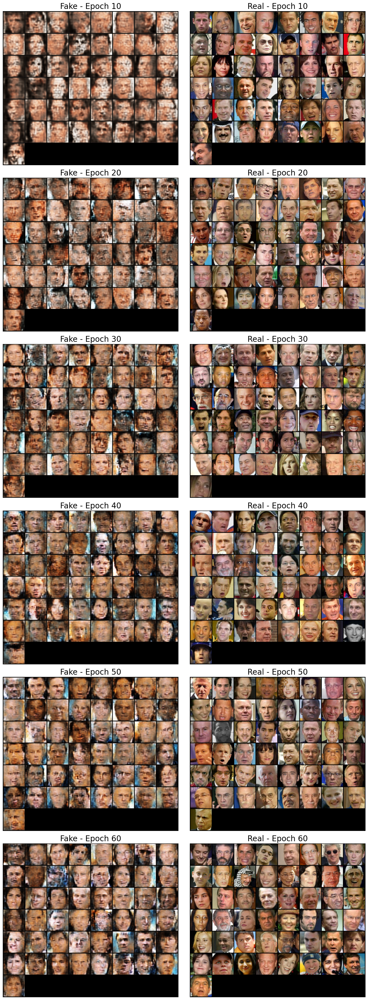

In [70]:
visualize_cGAN_results(num_epochs=60, every_n_epochs=10, folder_name='cGAN')

### References:   <a id="references"></a>
1.  https://github.com/Mitix-EPI/Face-Recognition-using-Siamese-Networks/tree/main
2.  https://github.com/pytorch/examples/tree/main/siamese_network
3.  https://pytorch.org/vision/0.15/models.html
4.  https://chat.openai.com
5.  https://www.youtube.com/watch?v=9hLcBgnY7cs&t=490s
6.  https://pytorch.org/docs/stable/generated/torch.nn.MarginRankingLoss.html
7.  https://pytorch.org/docs/stable/optim.html
8.  https://www.youtube.com/watch?v=pG0QZ7OddX4